In [1]:
import sys
sys.path.append('..')
from models.parrot_model import ParrotConditionPredictionModel
from IPython.core.display import display, HTML, Javascript, SVG
import yaml
import os
import torch
import json
import pandas as pd
from rdkit import Chem
from rdkit.Chem import AllChem, Draw
from pandarallel import pandarallel
from models.utils import load_dataset, print_args, inference_load
import seaborn as sns


In [2]:
config_file = '../configs/config_inference_use_uspto.yaml'
subgraph_file = './eval_data/eval_use_data/frag_cnt_nubmer_10000.txt'
input_path='../dataset/source_dataset/USPTO_condition_final/USPTO_condition_pred_category_maped_rxn_tpl.csv'      # 相较于原数据集添加了反应类别名称
best_model_dir = '../outputs/Parrot_train_in_USPTO_Condition'
analysis_results_save_path = './eval_data/group_attn_results'

debug = False

In [3]:

config = yaml.load(open(config_file, "r"),
                    Loader=yaml.FullLoader)


model_args = config['model_args']

model_args.update(
    {
    'pretrained_path': os.path.join('..', model_args['pretrained_path']),
    'output_dir': os.path.join('..', model_args['output_dir']),
    'best_model_dir': best_model_dir,
    'output_attention': True,
    }
)
dataset_args = config['dataset_args']

dataset_args.update(
    {
    'dataset_root': os.path.join('..', dataset_args['dataset_root'])
    })

print(
    '\n########################\Attention Evaluation configs:\n########################\n'
)
print(yaml.dump(config))
print('\n########################\n')


dataset_df, condition_label_mapping = load_dataset(**dataset_args)
dataset_df_with_rxn_class = pd.read_csv(os.path.join(dataset_args['dataset_root'], dataset_args['database_fname'].replace('.csv', '_pred_category_maped_rxn_tpl.csv')))

model_args['use_temperature'] = dataset_args['use_temperature']
model_args['decoder_args'].update({
    'tgt_vocab_size': len(condition_label_mapping[0]),
    'condition_label_mapping': condition_label_mapping
    })







model = ParrotConditionPredictionModel("bert", model_args['best_model_dir'], args=model_args, use_cuda=torch.cuda.is_available())


test_df = dataset_df.loc[dataset_df['dataset'] == 'test'].reset_index(drop=True)
if debug:
    test_df = test_df[:1000]
test_df = test_df[['canonical_rxn', 'condition_labels']]
test_df.columns = ['text', 'labels']
score_map_condition_type_dict = model.analyze_function_group_attention_with_condition(test_df, test_batch_size=16, subgraph_fpath=subgraph_file, analysis_results_save_path=analysis_results_save_path)



########################\Attention Evaluation configs:
########################

dataset_args:
  database_fname: USPTO_condition.csv
  dataset_root: ../dataset/source_dataset/USPTO_condition_final
  use_temperature: false
inference_args:
  beam:
    0: 2
    1: 3
    2: 1
    3: 3
    4: 1
model_args:
  best_model_dir: ../outputs/Parrot_train_in_USPTO_Condition
  decoder_args:
    d_model: 256
    dim_feedforward: 256
    dropout: 0.1
    nhead: 4
    num_decoder_layers: 3
    tgt_vocab_size: None
  evaluate_during_training: true
  fp16: false
  gradient_accumulation_steps: 1
  learning_rate: 0.0002
  manual_seed: 42
  max_seq_length: 512
  num_train_epochs: 100
  output_attention: true
  output_dir: .././out/Parrot_train_in_USPTO_Condition_enhance
  overwrite_output_dir: true
  pretrained_path: .././outputs/Parrot_train_in_USPTO_Condition
  regression: false
  thread_count: 8
  train_batch_size: 8
  wandb_project: Parrot_train_in_USPTO_Condition_enhance
  warmup_ratio: 0.0


########

In [4]:
import seaborn as sns
condition_types = ['c1', 's1', 's2', 'r1', 'r2']
for c_type in condition_types:
    print(f'#######################################  {c_type}  ####################################')
    score_map_df = score_map_condition_type_dict[c_type]

#     score_map_df = score_map_df.style.set_properties(**{
#     # 'background-color': 'Reds',
#     'background_gradient': 'Reds',
#     'font-size': '20pt',
# })
    score_map_df = score_map_df.style.background_gradient(cmap='Reds')
    score_map_df.to_excel(os.path.join(analysis_results_save_path, '{}_score_map.xlsx'.format(c_type)))
    # score_map_df = score_map_df.style.set_table_attributes('style="font-size: 25px"')
    display(score_map_df)

    # sns.heatmap(score_map_df)

#######################################  c1  ####################################


,Br[Cu]Br,C1CCNCC1,C1COCCO1,CC(=O)O[Pd]OC(C)=O,CC(=O)O,CC(C)(C)[P]([Pd][P](C(C)(C)C)(C(C)(C)C)C(C)(C)C)(C(C)(C)C)C(C)(C)C,CC(C)O[Ti](OC(C)C)(OC(C)C)OC(C)C,CCN(CC)CC,CN(C)C=O,CN(C)c1ccncc1,Cc1cc(C)c(N2CCN(c3c(C)cc(C)cc3C)C2=[Ru](Cl)(Cl)(=Cc2ccccc2)[P](C2CCCCC2)(C2CCCCC2)C2CCCCC2)c(C)c1,Cc1ccc(S(=O)(=O)O)cc1,Cc1ccccc1[P](c1ccccc1C)(c1ccccc1C)[Pd](Cl)(Cl)[P](c1ccccc1C)(c1ccccc1C)c1ccccc1C,Cl[Cu]Cl,Cl[Cu],Cl[Ni]Cl,Cl[Pd](Cl)([P](c1ccccc1)(c1ccccc1)c1ccccc1)[P](c1ccccc1)(c1ccccc1)c1ccccc1,Cl[Pd]Cl,Cl,Cl[Ti](Cl)(Cl)Cl,I[Cu]I,O=C(O)C(F)(F)F,O=S(=O)(O)O,O=[Ag],O=[Cu-],O=[Mn]=O,O=[Os](=O)(=O)=O,O=[Pt]=O,O=[Pt],O,[Cu]Br,[Cu]I,[Cu],[Fe],[Ni],[Pd],[Pt],[Rh],[Ru],[Zn],c1ccc([PH](c2ccccc2)(c2ccccc2)[Pd-4]([PH](c2ccccc2)(c2ccccc2)c2ccccc2)([PH](c2ccccc2)(c2ccccc2)c2ccccc2)[PH](c2ccccc2)(c2ccccc2)c2ccccc2)cc1,c1ccc([P](c2ccccc2)(c2ccccc2)[Pd]([P](c2ccccc2)(c2ccccc2)c2ccccc2)([P](c2ccccc2)(c2ccccc2)c2ccccc2)[P](c2ccccc2)(c2ccccc2)c2ccccc2)cc1
*B(O)O,0.000000,0.000000,0.000000,0.000000,0.000000,0.006860,0.000000,0.000000,0.000000,0.002658,0.010479,0.000000,0.007514,0.000000,0.000000,0.000000,0.006381,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008405,0.004876,0.000000,0.000000,0.000000,0.011518,0.003785,0.007340
*C(*)(*)*,0.016335,0.004895,0.004934,0.004487,0.005046,0.006230,0.007229,0.009946,0.005680,0.004648,0.005761,0.009306,0.005544,0.000000,0.006709,0.007070,0.005485,0.006568,0.006277,0.005640,0.008035,0.007844,0.006536,0.005239,0.000000,0.007353,0.003785,0.007538,0.011188,0.002933,0.015276,0.006107,0.007680,0.004994,0.007973,0.005788,0.004587,0.008275,0.000000,0.007114,0.002623,0.004780
*C(*)*,0.016397,0.005004,0.004972,0.004487,0.004900,0.006230,0.007290,0.010197,0.005566,0.004535,0.005639,0.009223,0.005034,0.003612,0.006475,0.006997,0.005414,0.006858,0.006423,0.006420,0.008174,0.007673,0.005935,0.005641,0.006584,0.007534,0.003891,0.007975,0.010809,0.002738,0.012896,0.006106,0.007703,0.005097,0.007745,0.005826,0.005319,0.009392,0.008555,0.006853,0.002779,0.004760
*C(*)=O,0.014121,0.005116,0.006746,0.000000,0.005387,0.017253,0.010023,0.009771,0.007068,0.005960,0.005130,0.008514,0.000000,0.008574,0.006736,0.005927,0.006343,0.005614,0.004007,0.007450,0.004700,0.007173,0.008155,0.006448,0.005375,0.006934,0.005278,0.005417,0.007506,0.002049,0.009902,0.005398,0.007830,0.006479,0.006030,0.004832,0.006773,0.005659,0.025186,0.005417,0.003836,0.006078
*C(*)C,0.017125,0.004865,0.005015,0.004838,0.004637,0.006369,0.006766,0.010082,0.005215,0.004708,0.006823,0.009513,0.004151,0.003907,0.007329,0.007420,0.005480,0.007392,0.006528,0.006142,0.007074,0.007327,0.006176,0.005986,0.006310,0.008516,0.004210,0.008490,0.012005,0.003205,0.012729,0.006225,0.007999,0.005097,0.007655,0.006101,0.005864,0.009819,0.009732,0.006992,0.002913,0.004750
*C(=O)C(F)(F)F,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009446,0.006528,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006145,0.000000,0.004407,0.000000,0.000000,0.000000,0.006973,0.006620,0.000000,0.000000,0.000000,0.004605,0.000000,0.000000,0.000000,0.004736,0.000000,0.004155,0.003531,0.004376,0.000000,0.000000,0.000000,0.000000,0.000000,0.005549
*C(=O)C*,0.015455,0.005688,0.007114,0.000000,0.005196,0.000000,0.009034,0.008298,0.006314,0.005142,0.005295,0.008314,0.000000,0.013204,0.006615,0.005545,0.005072,0.006076,0.004858,0.007995,0.008127,0.005986,0.008021,0.006040,0.005509,0.006111,0.004225,0.006172,0.008099,0.002032,0.007257,0.005830,0.007547,0.005596,0.006882,0.004757,0.007066,0.006740,0.024982,0.006091,0.000000,0.005409
*C(=O)CBr,0.015248,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007456,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009474,0.000000,0.008866,0.000000,0.000000,0.005851,0.000000,0.000000

#######################################  s1  ####################################


#######################################  s2  ####################################


,CC(=O)O,CC(C)O,CCCCCC,CCN(CC)CC,CCOC(C)=O,CCOCC,CCO,CN(C)C=O,CN1CCCC1=O,CN1CCCN(C)C1=O,COCCOC,CO,CS(C)=O,Cc1ccccc1,ClC(Cl)Cl,ClCCCl,ClCCl,Cl,N,O=C(O)C(F)(F)F,O=S(=O)(O)O,O=S(Cl)Cl,OCCO,O,[Na+],[OH-],c1ccccc1,c1ccncc1
*B(O)O,0.000000,0.000000,0.000000,0.000000,0.006464,0.005303,0.000000,0.006105,0.000000,0.000000,0.015891,0.000000,0.000000,0.008743,0.000000,0.000000,0.003713,0.002782,0.000000,0.000000,0.000000,0.000000,0.000000,0.007234,0.000000,0.003552,0.000000,0.000000
*C(*)(*)*,0.002948,0.004264,0.006466,0.009269,0.003443,0.004063,0.004198,0.002934,0.003797,0.004422,0.003334,0.004413,0.004243,0.003422,0.004538,0.002836,0.003799,0.006382,0.005752,0.004973,0.009375,0.000000,0.001801,0.004969,0.002038,0.003818,0.001964,0.002997
*C(*)*,0.004519,0.004160,0.006765,0.006503,0.003634,0.004661,0.004457,0.003198,0.004288,0.005587,0.003260,0.004608,0.004320,0.003447,0.004413,0.002842,0.004012,0.006274,0.005772,0.004416,0.010051,0.006778,0.001801,0.004989,0.002038,0.004116,0.002074,0.003194
*C(*)=O,0.005771,0.002426,0.004012,0.004491,0.004956,0.004174,0.005795,0.005924,0.007078,0.004552,0.002997,0.005820,0.004070,0.006440,0.004109,0.006436,0.004755,0.005256,0.004635,0.002627,0.009756,0.009700,0.005619,0.006485,0.002759,0.006145,0.010065,0.004493
*C(*)C,0.004873,0.004537,0.006292,0.002877,0.003955,0.005260,0.004327,0.003260,0.004110,0.006646,0.003943,0.004662,0.004186,0.003418,0.003622,0.003172,0.004083,0.007268,0.006068,0.004640,0.014200,0.006191,0.002448,0.005059,0.000000,0.004471,0.002080,0.003318
*C(=O)C(F)(F)F,0.000000,0.000000,0.000000,0.000000,0.002319,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002090,0.000000,0.002709,0.000000,0.000000,0.003899,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004322,0.000000,0.003741,0.000000,0.004425
*C(=O)C*,0.004579,0.000000,0.004621,0.004236,0.003499,0.004222,0.004980,0.005119,0.012498,0.005157,0.001609,0.005113,0.003788,0.005653,0.005109,0.006127,0.004195,0.004606,0.004471,0.002421,0.011748,0.007891,0.008709,0.005842,0.000000,0.005330,0.006428,0.003516
*C(=O)CBr,0.004025,0.000000,0.000000,0.000000,0.004145,0.003159,0.000000,0.007678,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005343,0.000000,0.005366,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007125,0.000000,0.009619,0.000000,0.000000
*C(=O)CC*,0.005476,0.000000,0.005083,0.000000,0.003825,0.004829,0.004682,0.004753,0.011091,0.006583,0.001913,0.004991,0.003518,0.005558,0.005516,0.001918,0.003853,0.006349,0.005359,0.002452,0.011192,0.007114,0.000000,0.005558,0.000000,0.004744,0.000000,0.002829
*C(=O)Cl,0.000000,0.000000,0.002069,0.000000,0.005584,0.005321,0.000000,0.008467,0.004680,0.000000,0.000000,0.009275,0.000000,0.031037,0.000000,0.008318,0.011524,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008234,0.000000,0.008369,0.000000,0.005317


#######################################  r1  ####################################


#######################################  r2  ####################################


In [9]:
from matplotlib import pyplot as plt
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)
import matplotlib.image as image
from rdkit.Chem import Draw
from matplotlib.patches import FancyBboxPatch

def draw_mol_to_png(smi, figname):
    mol = Chem.MolFromSmiles(smi)
    if mol is not None:
        Draw.MolToFile(
            mol,  # mol对象
            figname,  # 图片存储地址
            size=(300, 300), 
            kekulize=True, 
            wedgeBonds=True, 
            imageType=None, 
            fitImage=False, 
            options=None, 
            # **kwargs
        )

def draw_score_for_one_condition(df, condition_name, remove_zero=True, topn=15, figsize=(30,16), dpi=600, score_bar_save_path=None,title='Catalyst', color='Greens_r'):
    sns.set(context='notebook', style='ticks', font_scale=1.5)
    if not remove_zero:
        function_group_score_series = df[condition_name]
    else:
        function_group_score_series = df[condition_name][df[condition_name] != 0.0]
    
    function_group_score_with_name = list(zip(function_group_score_series.index.tolist(), function_group_score_series.tolist()))
    function_group_score_with_name.sort(key=lambda x:x[1], reverse=True)
    function_group_score_with_name = function_group_score_with_name[:topn]
    figure, axes = plt.subplots(nrows=1, ncols=1, figsize=figsize, dpi=dpi)

    fig = sns.barplot(
                # x=[x[0] for x in function_group_score_with_name],
                x=[f'h{x}'  for x in range(len(function_group_score_with_name))],
                y=[x[1] for x in function_group_score_with_name], 
                # ax=axes
                # color = '#b9e38d'
                palette=sns.color_palette(color, 20),
                )
    fig.set_ylim(
        ymin=max(0, (function_group_score_with_name[-1][1] - (function_group_score_with_name[0][1] - function_group_score_with_name[-1][1])*2/3)),
                 )
    fig.set_zorder(0)
#     new_patches = []
#     for patch in reversed(fig.patches):
#         bb = patch.get_bbox()
#         color = patch.get_facecolor()
#         p_bbox = FancyBboxPatch((bb.xmin, bb.ymin),
#                                 abs(bb.width), abs(bb.height),
#                                 boxstyle="round,pad=-0.0040,rounding_size=0.015",
#                                 ec="none", fc=color,
#                                 mutation_aspect=4
#                                 )
#         patch.remove()
#         new_patches.append(p_bbox)
#     for patch in new_patches:
#         fig.add_patch(patch)
    # plt.bar([x[0] for x in function_group_score_with_name], 
    #         [x[1] for x in function_group_score_with_name], axes=axes)
    plt.xticks(rotation=60)
    # axes.set_title('Catalyst: {}'.format(condition_name))
    axes.set_title(title)
    axes.spines['right'].set_color('none')
    axes.spines['top'].set_color('none')
    plt.savefig(score_bar_save_path, bbox_inches='tight')

#     plt.show()
    return function_group_score_with_name

def draw_score_for_one_condition_add_frag(df, condition_name, remove_zero=True, one_group_fig_path=None, title='Catalyst', color='Greens_r'):
    if not os.path.exists(one_group_fig_path):
        os.makedirs(one_group_fig_path)
    topn = 15
    score_bar_save_path = os.path.join(one_group_fig_path, 'bar.png')
    condition_fig_save_path = os.path.join(one_group_fig_path, 'condition.png')
    
    function_group_score_with_name = draw_score_for_one_condition(df, condition_name, figsize=(30,16), dpi=300, score_bar_save_path=score_bar_save_path, title=title, color=color)
    
    fragments = [x[0] for x in function_group_score_with_name]
    # fragments = [Chem.MolFromSmiles(smi) for smi in fragments_smiles]
    
    draw_mol_to_png(condition_name, condition_fig_save_path)
    
    [draw_mol_to_png(smi, os.path.join(one_group_fig_path, f'{idx}.png')) for idx, smi in enumerate(fragments)]
    
    fig, ax = plt.subplots(figsize=(32,25), dpi=300)
    
    barxy = [0.5, 0.45]
    bar_img_arr = plt.imread(score_bar_save_path)
    imagebox = OffsetImage(bar_img_arr, zoom=0.22)
    ab = AnnotationBbox(imagebox, barxy,
                        xycoords='data',
                        boxcoords="offset points",
                        pad=0.0,
                        frameon=False,
                        )
    imagebox.image.axes = ax
    ax.add_artist(ab)
    
    condition_xy = [0.515, 0.68]
    condition_img_arr = plt.imread(condition_fig_save_path)
    imagebox = OffsetImage(condition_img_arr, zoom=0.6)
    imagebox.image.axes = ax

    ab = AnnotationBbox(imagebox, condition_xy,
                        xycoords='data',
                        boxcoords="offset points",
                        pad=0.5,
                        frameon=False,
                        )
    ax.add_artist(ab)
    
    frag_xb = 0.115
    frag_xe = 0.918
    for idx in range(len(fragments)):
        frag_img_arr = plt.imread(os.path.join(one_group_fig_path, f'{idx}.png'))
        frag_xy = [frag_xb + idx*(frag_xe - frag_xb)/(len(fragments) - 1), 0.13]
        imagebox = OffsetImage(frag_img_arr, zoom=0.28)
        imagebox.image.axes = ax

        ab = AnnotationBbox(imagebox, frag_xy,
                            xycoords='data',
                            boxcoords="offset points",
                            pad=0.5,
                            frameon=False,
                            )

        ax.add_artist(ab)
    
    plt.axis('off')
    plt.savefig(os.path.join(one_group_fig_path, 'end_results.png'), bbox_inches='tight')
    

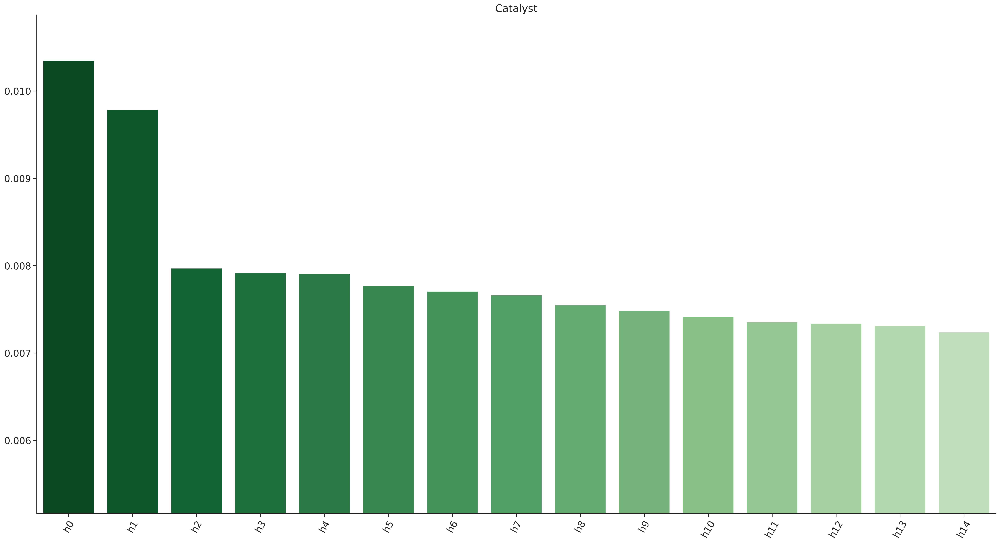

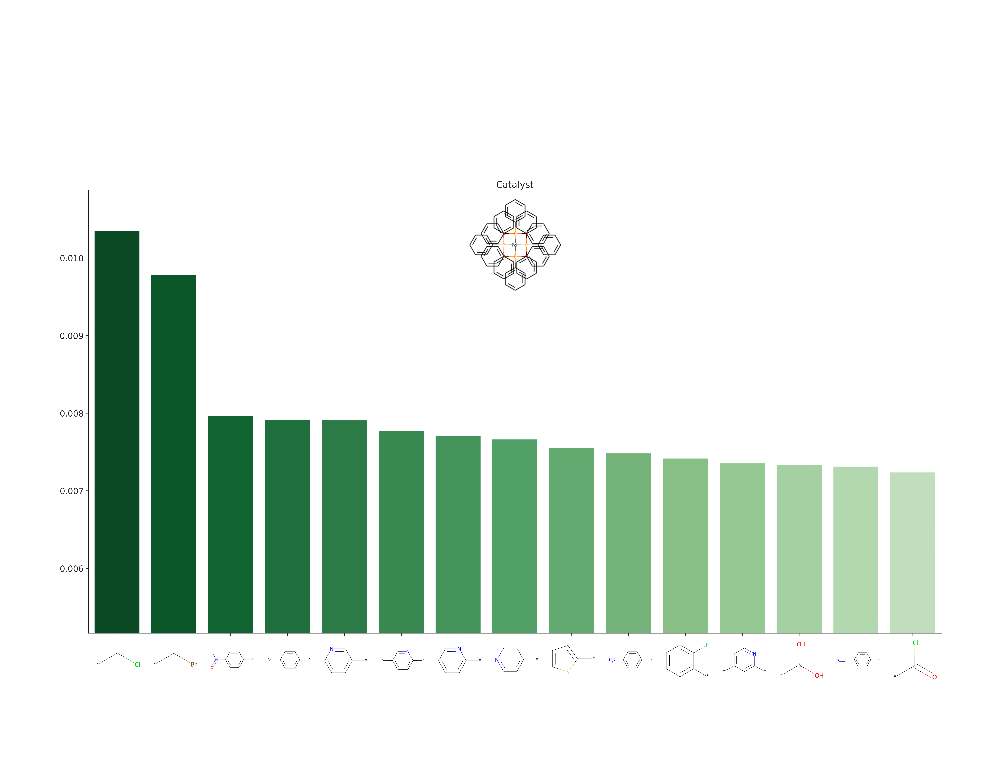

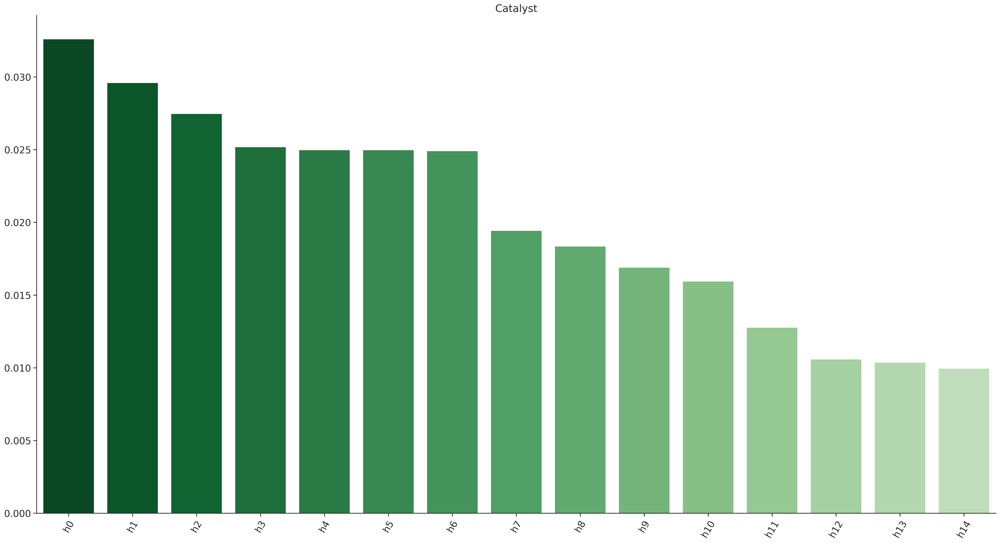

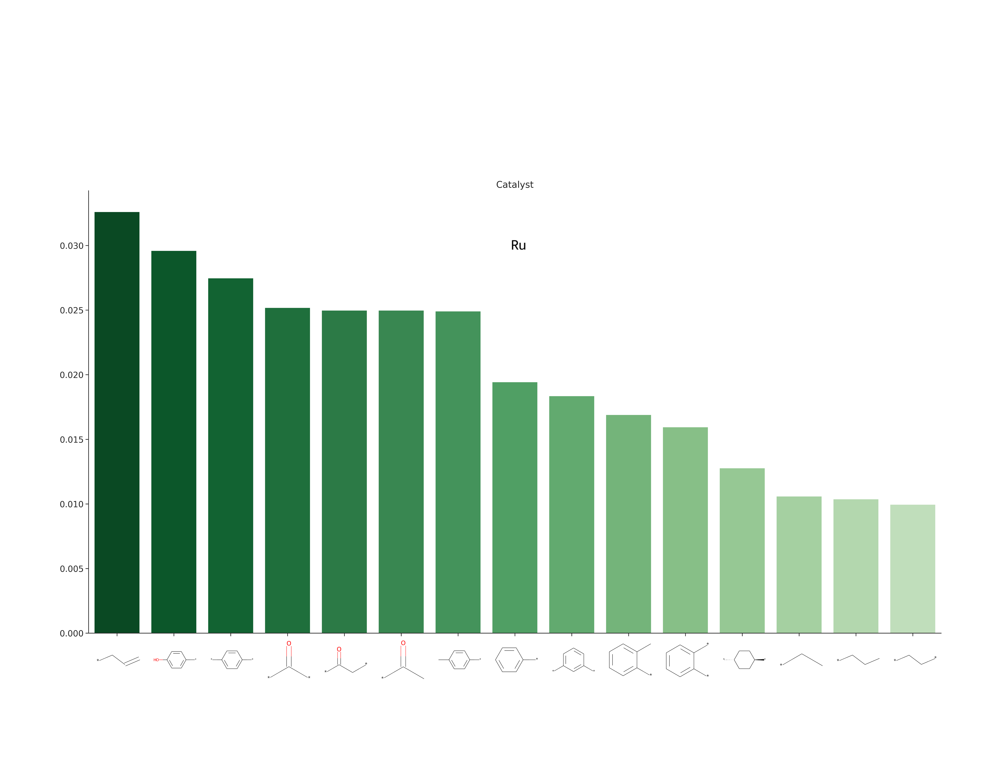

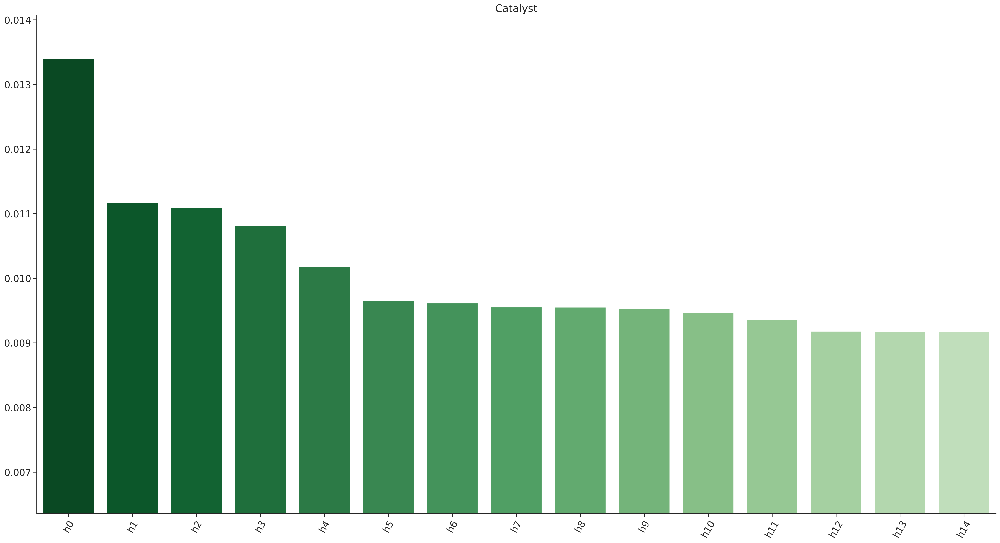

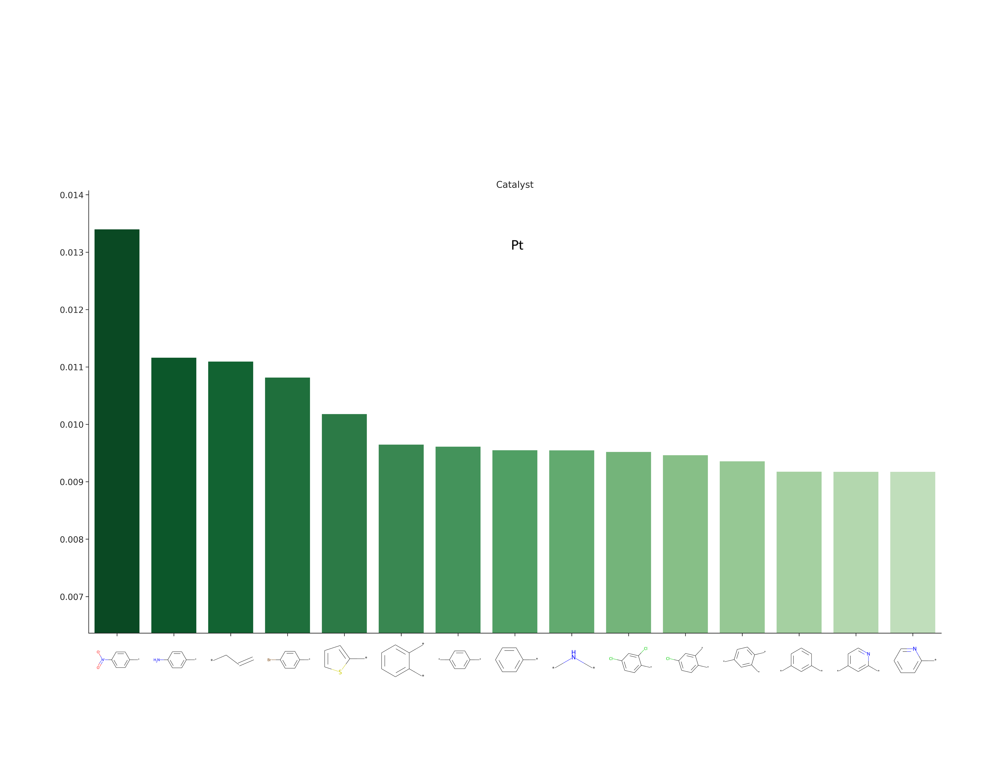

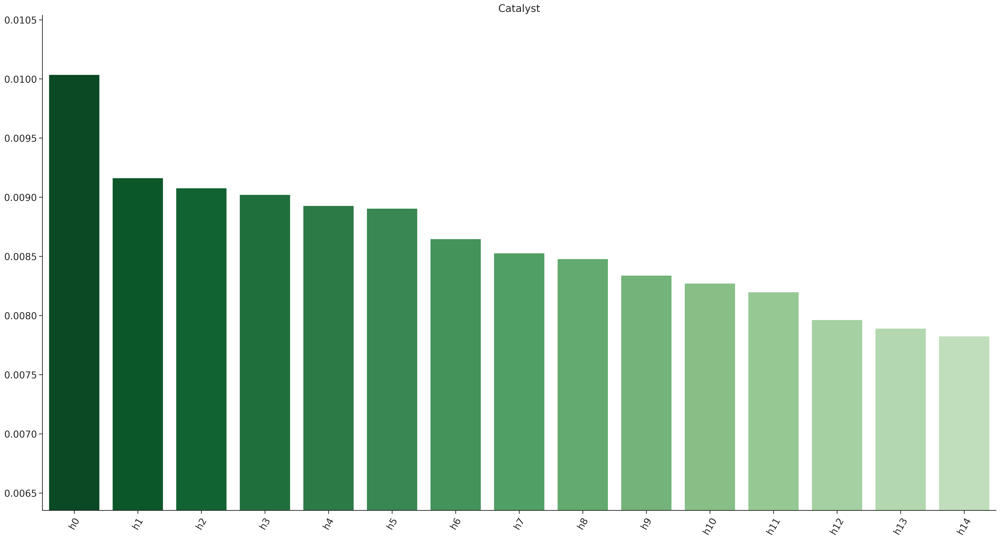

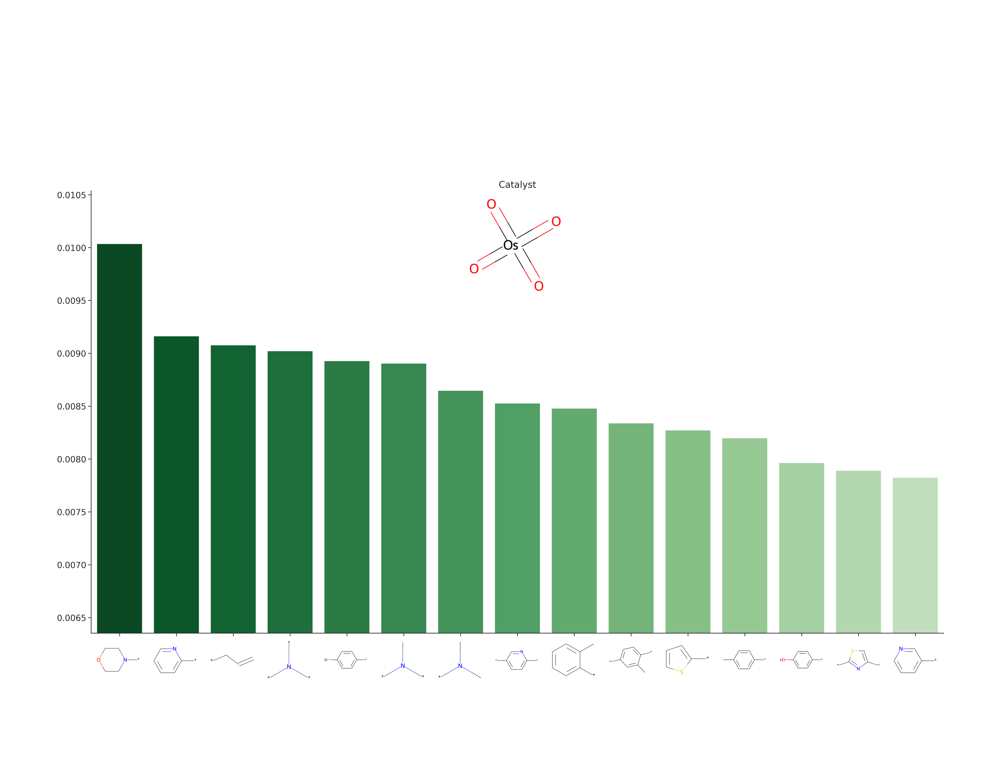

In [7]:
draw_catalyst_list = [
    'c1ccc([P](c2ccccc2)(c2ccccc2)[Pd]([P](c2ccccc2)(c2ccccc2)c2ccccc2)([P](c2ccccc2)(c2ccccc2)c2ccccc2)[P](c2ccccc2)(c2ccccc2)c2ccccc2)cc1',
    '[Ru]',
    '[Pt]',
    'O=[Os](=O)(=O)=O',
    ]
for idx, condition_name in enumerate(draw_catalyst_list):
    draw_score_for_one_condition_add_frag(score_map_condition_type_dict['c1'], condition_name, one_group_fig_path=f'./attn_figure/c1/conditon_{idx}/')
    # break

RDKit WARNING: [21:35:14] WARNING: not removing hydrogen atom without neighbors
[21:35:14] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [21:35:14] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [21:35:14] WARNING: not removing hydrogen atom without neighbors
RDKit WARNING: [21:35:14] WARNING: not removing hydrogen atom without neighbors
[21:35:14] WARNING: not removing hydrogen atom without neighbors
[21:35:14] WARNING: not removing hydrogen atom without neighbors
[21:35:14] WARNING: not removing hydrogen atom without neighbors


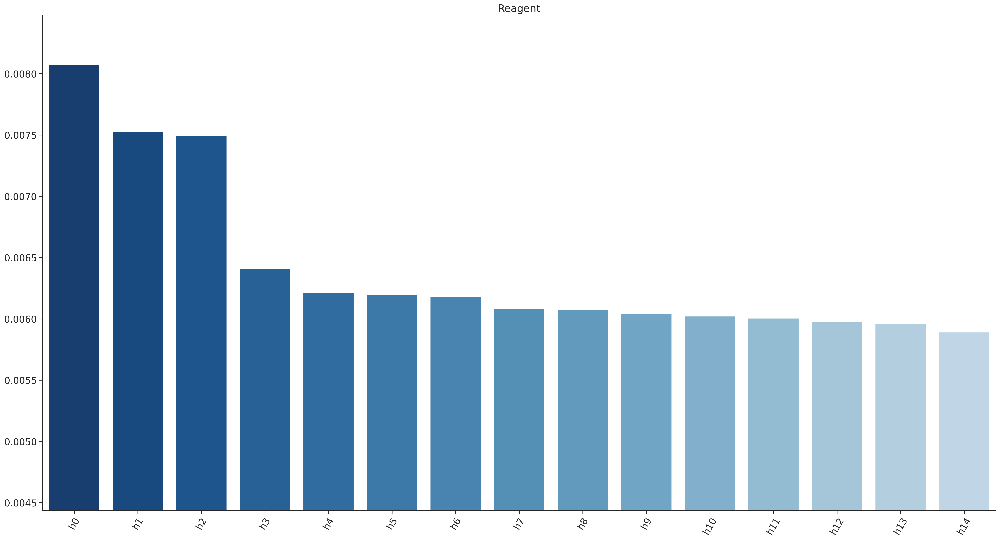

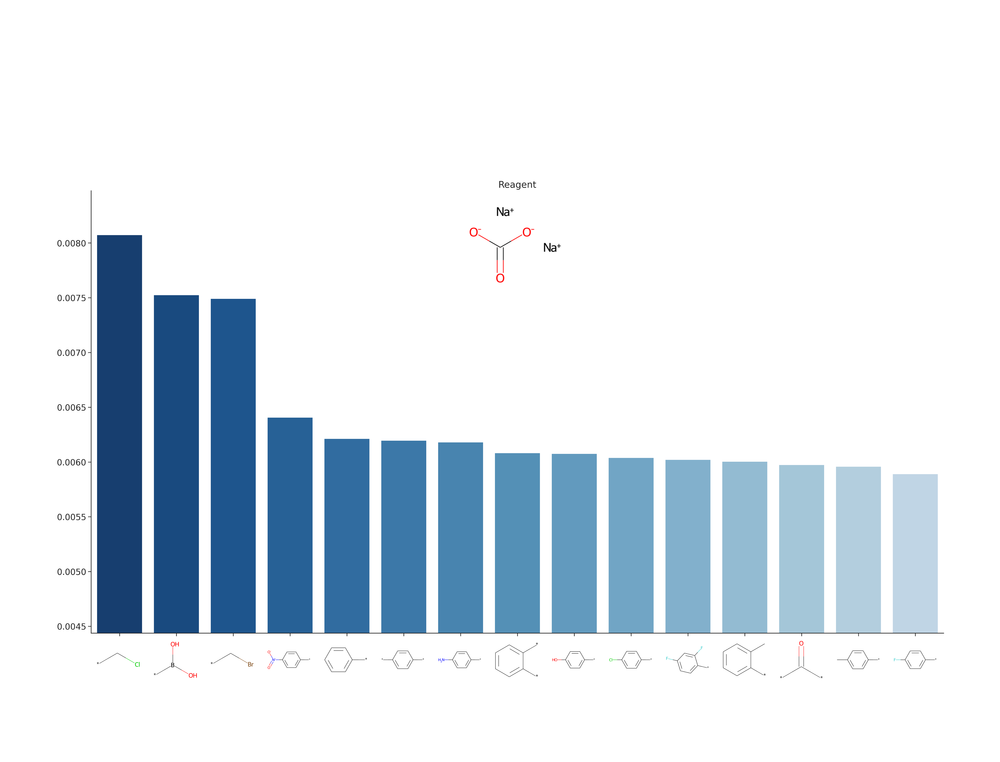

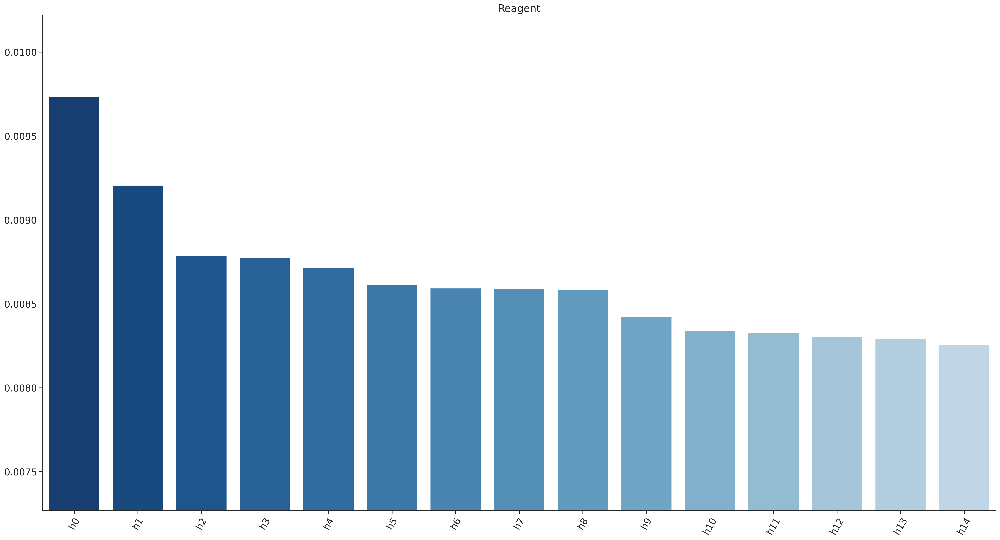

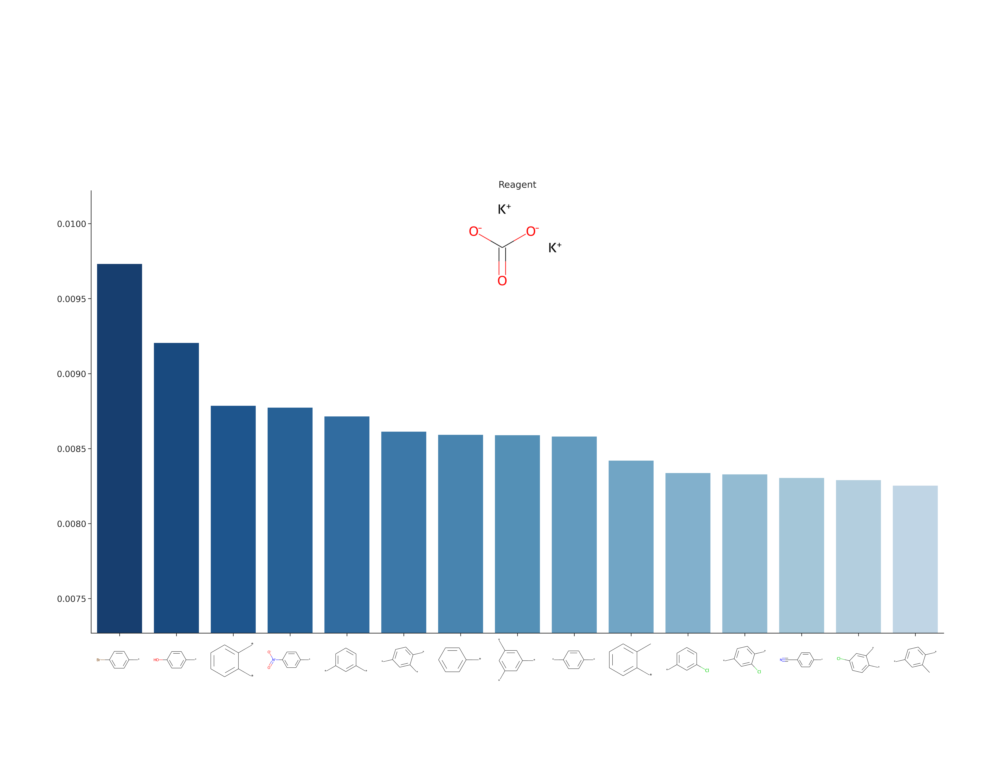

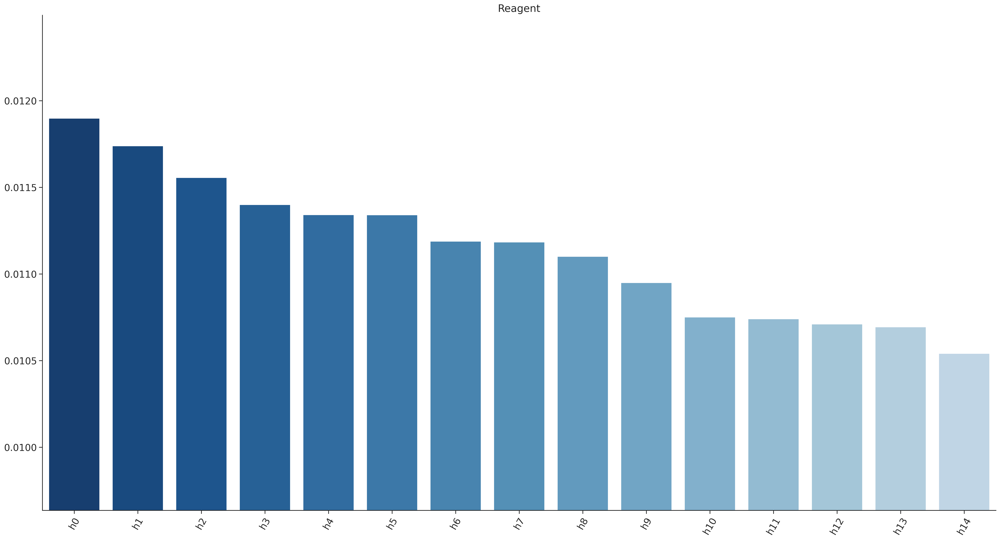

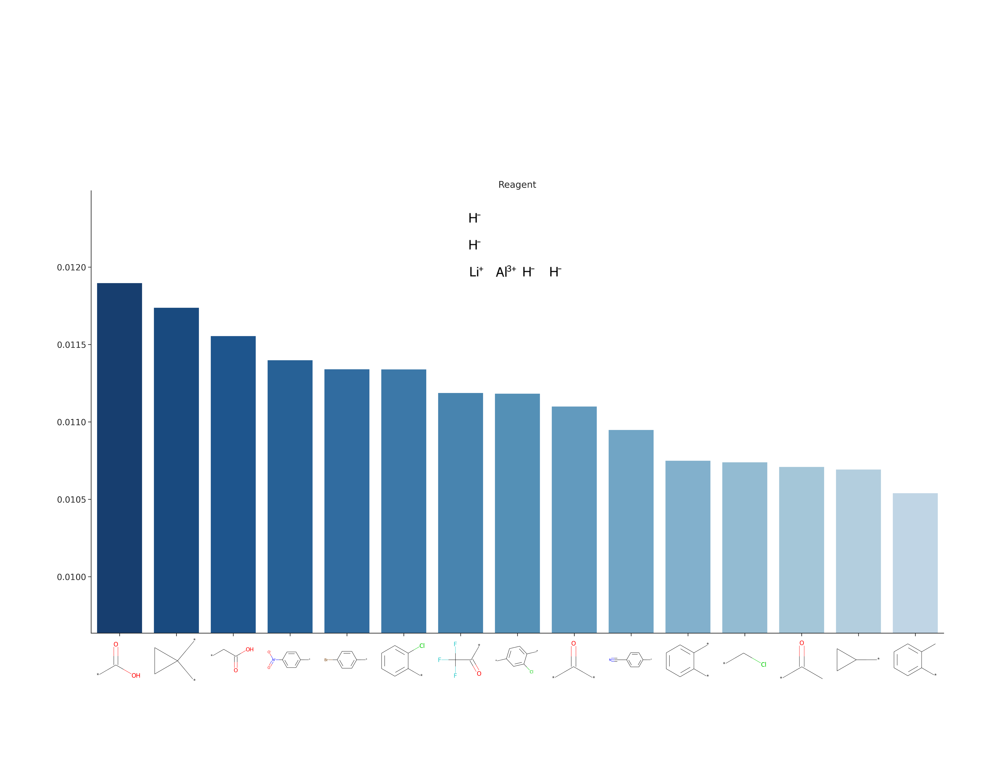

In [11]:
draw_reagent1_list = [
    'O=C([O-])[O-].[Na+].[Na+]',
    'O=C([O-])[O-].[K+].[K+]',
    '[Al+3].[H-].[H-].[H-].[H-].[Li+]'
    ]
for idx, condition_name in enumerate(draw_reagent1_list):
    draw_score_for_one_condition_add_frag(score_map_condition_type_dict['r1'], condition_name, one_group_fig_path=f'./attn_figure/r1/conditon_{idx}/',title='Reagent', color='Blues_r')
    # break